In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('..')
import pandas as pd
import numpy as np
import hydroeval
from src import load_data, evaluate
import netCDF4 as nc
import pickle
from matplotlib import pyplot as plt
from matplotlib import dates
import datetime as dt
import tikzplotlib

In [2]:
vic_predictions = pd.read_csv('../data/GRIP-E_Hydrographs_VIC-GRU_test2013+2014_allStations.csv').drop(['time', 'hour', 'precip [mm/day]'], axis=1)
subid2gauge = pd.read_csv('../data/VIC-GRU_subid2gauge.csv')[['SubId', 'ID']].set_index('SubId')

vic_predictions = vic_predictions.rename(lambda c: subid2gauge.loc[int(c[3:6])].values[0] if c not in ['date', 'hour', 'precip [mm/day]'] else c, axis=1)
vic_predictions = vic_predictions.set_index('date').transpose().unstack().reset_index().rename({'level_0': 'date', 'level_1': 'station', 0: 'vic_prediction'}, axis=1)
vic_predictions['date'] = pd.to_datetime(vic_predictions['date'])

In [3]:
xgb_file = '20190706-082538'
xgb_predictions = pickle.load(open('../pickle/results/XGBoost_VIC_aggregateForcings_{}.pkl'.format(xgb_file),'rb'))
xgb_predictions = xgb_predictions.drop(['actual'], axis=1).rename({'prediction': 'xgb_prediction'}, axis=1)

In [4]:
lin_file = '20190708-091424'
lin_predictions = pickle.load(open('../pickle/results/LinReg_VIC_aggregateForcings_{}.pkl'.format(lin_file),'rb'))
lin_predictions = lin_predictions.drop(['actual'], axis=1).rename({'prediction': 'lin_prediction'}, axis=1)

In [5]:
ground_truth = load_data.load_discharge_gr4j_vic()
ground_truth = ground_truth[~pd.isna(ground_truth['runoff'])]

../src/load_data.py:20: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  data = pd.read_csv(os.path.join(dir, f), skiprows=2, skipfooter=1, index_col=False, header=None, names=['runoff'], na_values='-1.2345')
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


In [6]:
data = pd.merge(ground_truth, vic_predictions, on=['date', 'station'])
data = pd.merge(data, lin_predictions, on=['date', 'station'])
data = pd.merge(data, xgb_predictions, on=['date', 'station'])
data = data[(data['date'] > '2012-12-31') & (data['date'] < '2015-01-01')]

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
../src/evaluate.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(17,4))
../src/evaluate.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until exp

XGB outperforms VIC in 40 of the stations by 0.5390322637646364 on average
XGB almost outperforms VIC in 42 of the stations (tol 0.07)
VIC Median NSE (clipped to 0) 0.25585666713544375 / Min -7.175453461197932 / Max 0.6322740118357577
XGB Median NSE (clipped to 0) 0.5222957762280172 / Min -0.20600531332203498 / Max 0.666221324763711
LIN Median NSE (clipped to 0) 0.37990824204466384 / Min -1.6766047081809439 / Max 0.5845953217295347
VIC Median MSE (clipped to 0) 125.5542195527975 / Min 12.335515645604728 / Max 30813.891560913642
XGB Median MSE (clipped to 0) 96.82126751132567 / Min 2.9515256400193297 / Max 31010.79787935949
XGB Median MSE (clipped to 0) 109.11964356213701 / Min 3.773554642212663 / Max 139157.30643437852


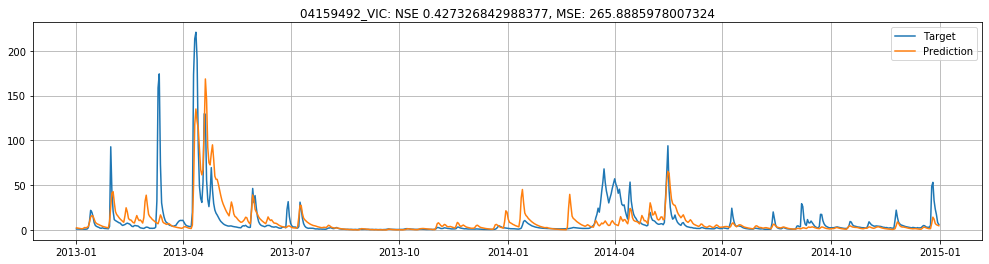

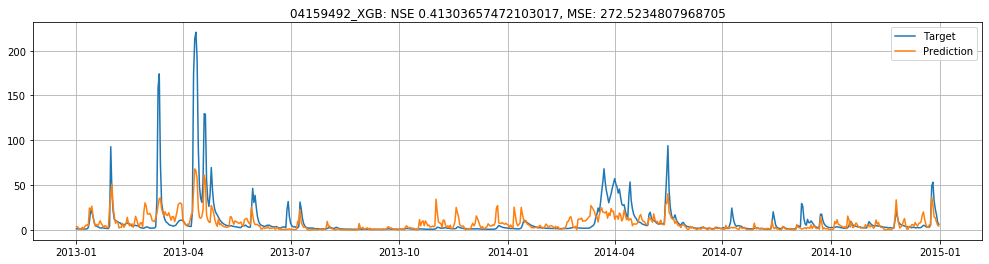

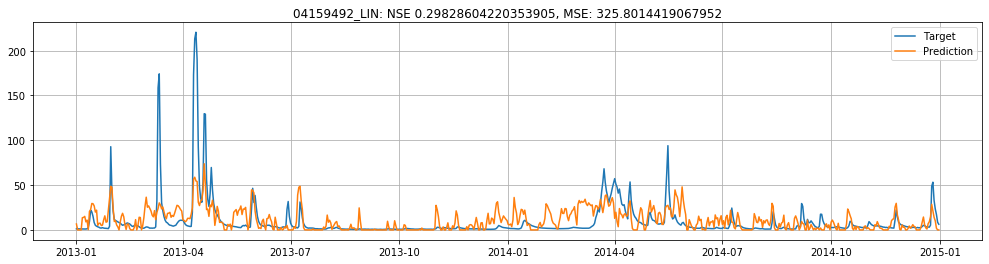

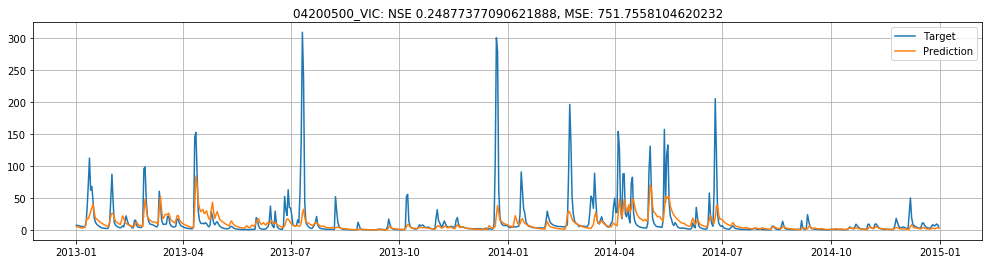

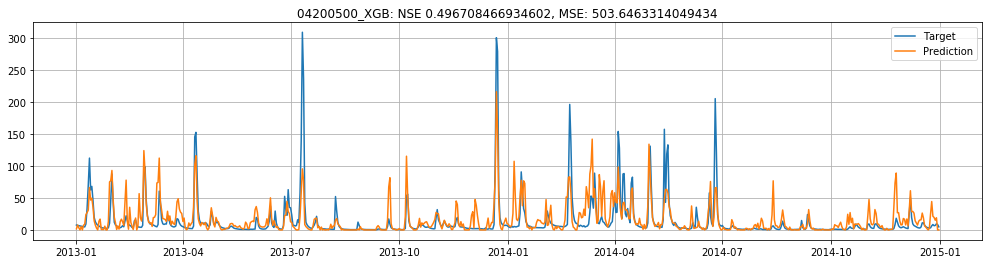

...

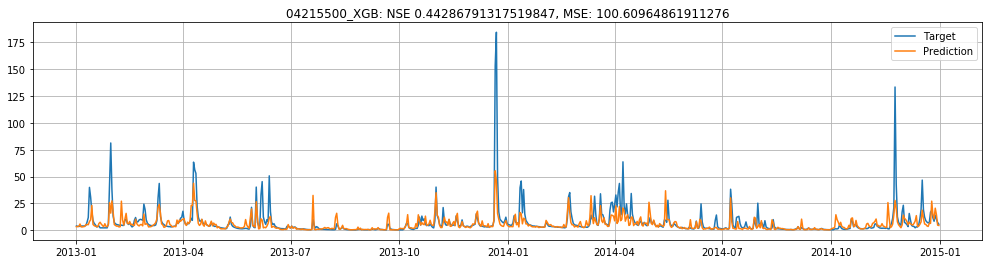

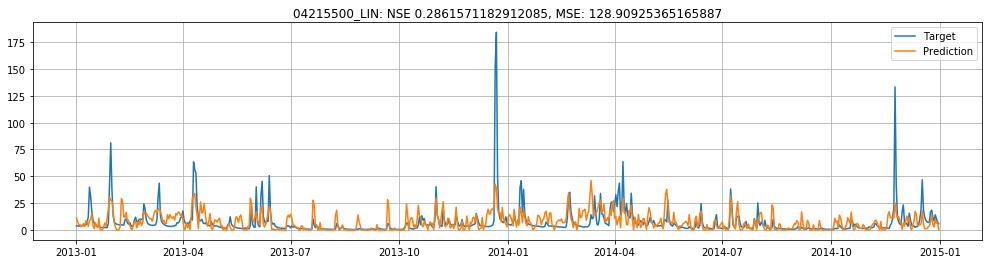

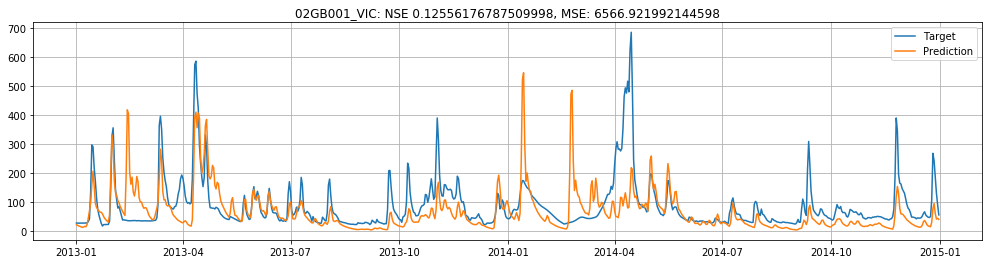

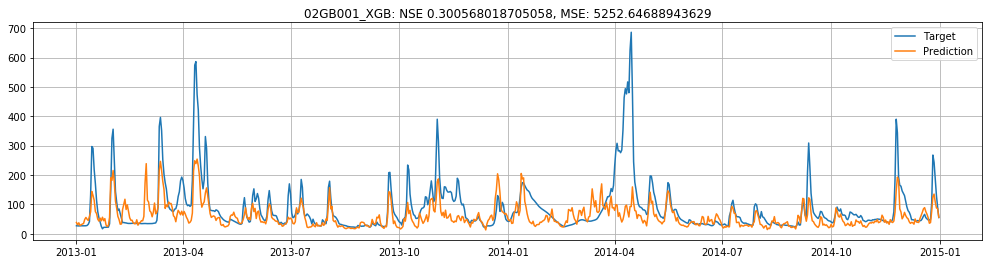

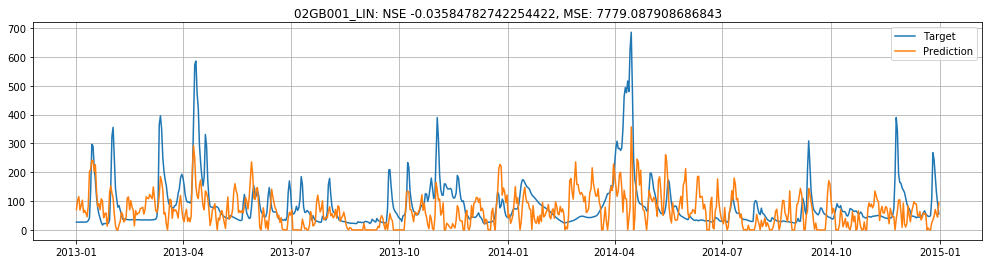

In [7]:
plot_list = []
vic_nse_list, vic_mse_list = [], []
xgb_nse_list, xgb_mse_list = [], []
lin_nse_list, lin_mse_list = [], []
xgb_larger, xgb_almost_larger = 0, 0
xgb_outperf = 0
tol = 0.07
for station in data['station'].unique():
    station_data = data[data['station']==station].set_index('date')
    
    vic_nse, vic_mse = evaluate.evaluate_daily(station+'_VIC', station_data[['vic_prediction']], station_data['runoff'], plot=True)#station in plot_list)
    xgb_nse, xgb_mse = evaluate.evaluate_daily(station+'_XGB', station_data[['xgb_prediction']], station_data['runoff'], plot=True)#station in plot_list)
    lin_nse, lin_mse = evaluate.evaluate_daily(station+'_LIN', station_data[['lin_prediction']], station_data['runoff'], plot=True)#station in plot_list)
    vic_nse_list.append(vic_nse)
    vic_mse_list.append(vic_mse)
    xgb_nse_list.append(xgb_nse)
    xgb_mse_list.append(xgb_mse)
    lin_nse_list.append(lin_nse)
    lin_mse_list.append(lin_mse)
    if xgb_nse > vic_nse:
        xgb_larger += 1
        xgb_outperf += (xgb_nse - vic_nse)
    if xgb_nse > vic_nse - tol:
        xgb_almost_larger += 1

print('XGB outperforms VIC in {} of the stations by {} on average'.format(xgb_larger, xgb_outperf/xgb_larger))
print('XGB almost outperforms VIC in {} of the stations (tol {})'.format(xgb_almost_larger, tol))
print('VIC Median NSE (clipped to 0)', np.median(vic_nse_list), '/ Min', np.min(vic_nse_list), '/ Max', np.max(vic_nse_list))
print('XGB Median NSE (clipped to 0)', np.median(xgb_nse_list), '/ Min', np.min(xgb_nse_list), '/ Max', np.max(xgb_nse_list))
print('LIN Median NSE (clipped to 0)', np.median(lin_nse_list), '/ Min', np.min(lin_nse_list), '/ Max', np.max(lin_nse_list))

print('VIC Median MSE (clipped to 0)', np.median(vic_mse_list), '/ Min', np.min(vic_mse_list), '/ Max', np.max(vic_mse_list))
print('XGB Median MSE (clipped to 0)', np.median(xgb_mse_list), '/ Min', np.min(xgb_mse_list), '/ Max', np.max(xgb_mse_list))
print('XGB Median MSE (clipped to 0)', np.median(lin_mse_list), '/ Min', np.min(lin_mse_list), '/ Max', np.max(lin_mse_list))

04177000 VIC: 0.28316449000390853 XGB: 0.09698319798200306 Ridge: 0.4141242205084906
04166500 VIC: -2.2022977801603005 XGB: 0.6446791775375731 Ridge: 0.4235383016212083


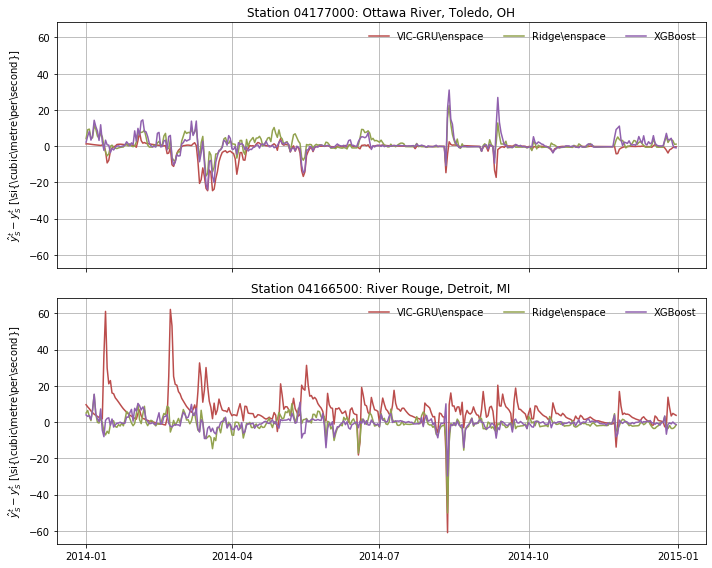

In [20]:
stations = ['04177000', '04166500']
station_names = ['Ottawa River, Toledo, OH', 'River Rouge, Detroit, MI']

f, ax = plt.subplots(nrows=2, ncols=1, figsize=(10,8), sharex=True, sharey=True)
i = 0
for station in stations:
    station_data = data[data['station']==station].set_index('date')
    station_data = station_data.loc['2014']

    vic_nse, _ = evaluate.evaluate_daily(station, station_data[['vic_prediction']], station_data['runoff'], plot=False)
    xgb_nse, _ = evaluate.evaluate_daily(station, station_data[['xgb_prediction']], station_data['runoff'], plot=False)
    lin_nse, _ = evaluate.evaluate_daily(station, station_data[['lin_prediction']], station_data['runoff'], plot=False)
    print(station, 'VIC:', vic_nse, 'XGB:', xgb_nse, 'Ridge:', lin_nse)

    ax[i].set_title('Station {}: {}'.format(station, station_names[i]))
    #ax[i].plot(range(len(station_data)), station_data['runoff'], label='Target', color='#92a24e')#b9495e')
    ax[i].plot(range(len(station_data)), (station_data['vic_prediction'].clip(0) - station_data['runoff']), label='VIC-GRU\\enspace'.format(vic_nse), color='#bb4d4c')#8960b3')
    ax[i].plot(range(len(station_data)), (station_data['lin_prediction'].clip(0) - station_data['runoff']), label='Ridge\\enspace'.format(lin_nse), color='#92a24e')#b78b39')
    ax[i].plot(range(len(station_data)), (station_data['xgb_prediction'].clip(0) - station_data['runoff']), label='XGBoost'.format(xgb_nse), color='#9061ae')#61ad65')
    ax[i].grid()
    l = ax[i].legend(ncol=3, loc='upper right', frameon=False, columnspacing=2)

    dates = pd.Series(pd.date_range('2014-01-01', '2015-01-01', freq='D'))
    xticks = dates[dates.dt.day==1][::3]
    ax[i].set_xticks(xticks.index.values)
    ax[i].set_xticklabels(xticks.dt.strftime('%Y-%m').values, rotation=0)
    ax[i].set_ylabel('$\\hat{y}_S^t - y_S^t$ [\si{\cubic\metre\per\second}]')
    i += 1
plt.tight_layout()

tikzplotlib.save('../figures/{}_vic-gru_xgboost{}_linreg{}_2014.tex'.format('-'.join(stations), xgb_file, lin_file), figureheight='\\figureheight', figurewidth='\\figurewidth')

In [9]:
print(pd.DataFrame([vic_nse_list, lin_nse_list, xgb_nse_list], index=['VIC-GRU', 'Ridge', 'XGBoost']).transpose().describe())

         VIC-GRU      Ridge    XGBoost
count  46.000000  46.000000  46.000000
mean    0.015962   0.293737   0.461663
std     1.184477   0.382780   0.161742
min    -7.175453  -1.676605  -0.206005
25%     0.120042   0.298495   0.411604
50%     0.255857   0.379908   0.522296
75%     0.353694   0.468738   0.560518
max     0.632274   0.584595   0.666221


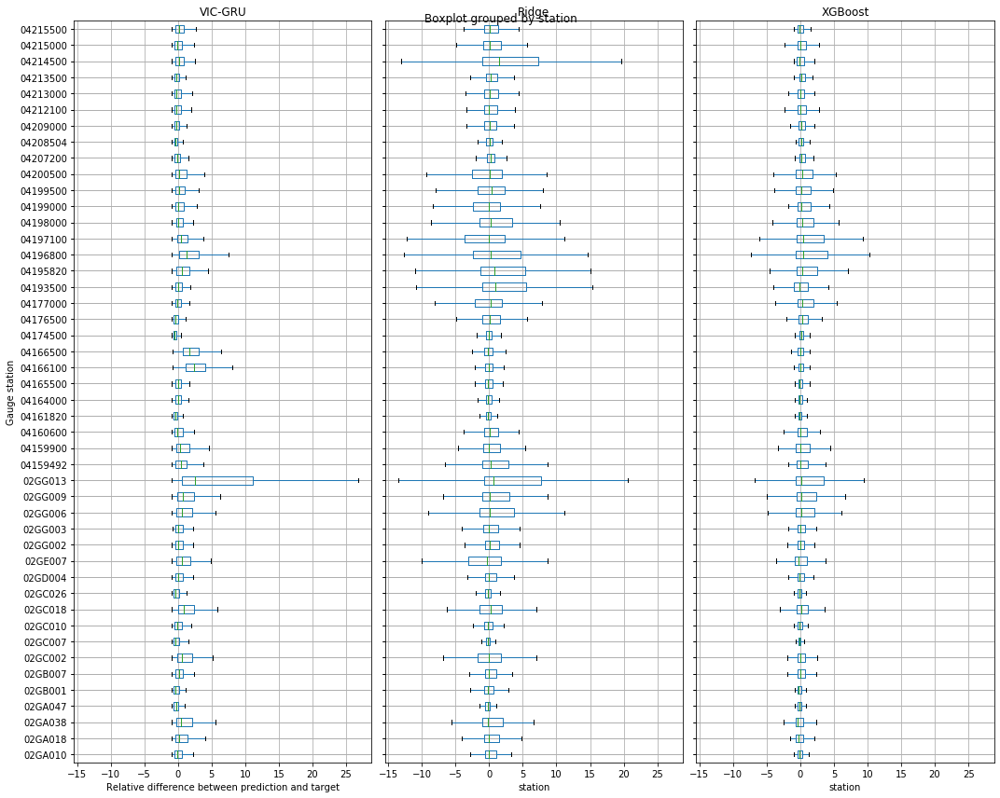

In [10]:
a = data.copy()
a['VIC-GRU'] = (a['vic_prediction'] - a['runoff']) / a['runoff']
a['Ridge'] = (a['lin_prediction'] - a['runoff']) / a['runoff']
a['XGBoost'] = (a['xgb_prediction'] - a['runoff']) / a['runoff']
f1, f2, f3 = a.boxplot(by='station', column=['VIC-GRU', 'Ridge', 'XGBoost'], showfliers=False, vert=False, figsize=(15,12), layout=(1,3))
f1.set_xlabel('Relative difference between prediction and target')
f1.set_ylabel('Gauge station')  
plt.tight_layout()

In [18]:
(0.522296 - 0.379908) / 0.379908   

0.37479600324289025

In [12]:
(0.522296 - 0.255857) / 0.255857

1.041359040401474

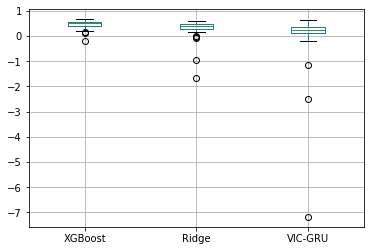

In [14]:
pd.DataFrame([xgb_nse_list, lin_nse_list, vic_nse_list], index=['XGBoost', 'Ridge', 'VIC-GRU']).transpose().boxplot()

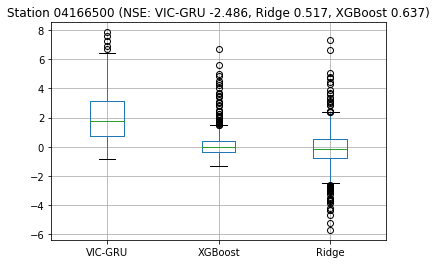

In [15]:
station = '04166500'

f = plt.figure()
station_data = data[data['station']==station].set_index('date')

vic_nse, _ = evaluate.evaluate_daily(station, station_data[['vic_prediction']], station_data['runoff'], plot=False)
xgb_nse, _ = evaluate.evaluate_daily(station, station_data[['xgb_prediction']], station_data['runoff'], plot=False)
lin_nse, _ = evaluate.evaluate_daily(station, station_data[['lin_prediction']], station_data['runoff'], plot=False)

plt.title('Station {} (NSE: VIC-GRU {:.3f}, Ridge {:.3f}, XGBoost {:.3f})'.format(station, vic_nse, lin_nse, xgb_nse))
f = pd.DataFrame([(station_data['vic_prediction'] - station_data['runoff'])/station_data['runoff'], (station_data['xgb_prediction'] - station_data['runoff'])/station_data['runoff'], (station_data['lin_prediction'] - station_data['runoff'])/station_data['runoff']], index=['VIC-GRU', 'XGBoost', 'Ridge']).transpose().boxplot()

In [16]:
xgb_nse_list[37], vic_nse_list[37], xgb_nse_list[7], vic_nse_list[7]

(0.5975178232866429,
 -7.175453461197932,
 -0.20600531332203498,
 0.22992352457666565)

In [17]:
data['station'].unique()[12]

'04177000'